## Download Dataset
For test learning, I decided to use SeaShip dataset.  
* Origianl Author URL: https://github.com/jiaming-wang/SeaShips
Unfortunately, the link to the original dataset is no longer valid.
Therefore, considering the convenience of data processing, we will use the configuration of other people's datasets uploaded to Roboflow.
* https://universe.roboflow.com/sparks-h3omf/seaship-woce2
* Image and Annotation Format: YOLO Darknet

### Download Dataset with RoboFlow
* The code below is the code provided by Roboflow.
* Please use your own API keys.

In [1]:
!pip install --break-system-packages roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Your API key here")
project = rf.workspace("sparks-h3omf").project("seaship-woce2")
version = project.version(3)
dataset = version.download("darknet")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 45.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 46.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 76.0 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 82.7 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 46.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━


Extracting Dataset Version Zip to seaship-3 in darknet:: 100%|██████████| 13966/13966 [01:12<00:00, 193.67it/s]


### Let's Check downloaded dataset
The code below shows directory structure of dataset.  
The darknet dataset contains the same txt file as the image file name in one directory, which represents the label.
* (image name).jpg
* (image name).txt
A label file represents one object in a line, and its format is as below.
* <class_id> <x_center> <y_center> <width> <height>
* Range: 0~1

In [13]:
from pathlib import Path
from itertools import islice

base = Path("seaship-3")
N = 6

for d in [base] + [p for p in base.iterdir() if p.is_dir()]:
    print(d)
    for f in islice(d.iterdir(), N):
        print("  ", f.name)
    print("   ...")

print("\nDataset Class names")
labels = base / "train" / Path("_darknet.labels")
print(labels.read_text())

seaship-3
   README.dataset.txt
   README.roboflow.txt
   test
   train
   valid
   ...
seaship-3/test
   003102_jpg.rf.eed98ba0a26a3840a1989a3891bd3ab9.jpg
   003102_jpg.rf.eed98ba0a26a3840a1989a3891bd3ab9.txt
   003106_jpg.rf.9f506d8791a2429592772ec44bcbca2b.jpg
   003106_jpg.rf.9f506d8791a2429592772ec44bcbca2b.txt
   003107_jpg.rf.4791fdae05227f9d81a611c0f82de7ec.jpg
   003107_jpg.rf.4791fdae05227f9d81a611c0f82de7ec.txt
   ...
seaship-3/train
   000001_jpg.rf.82f6762cda38aee4f2e83ae8e4f92caa.jpg
   000001_jpg.rf.82f6762cda38aee4f2e83ae8e4f92caa.txt
   000002_jpg.rf.3519a1c7c4378b78fba1798b8be856b2.jpg
   000002_jpg.rf.3519a1c7c4378b78fba1798b8be856b2.txt
   000003_jpg.rf.c484d7c73607e7cdff25b552e8ff8a73.jpg
   000003_jpg.rf.c484d7c73607e7cdff25b552e8ff8a73.txt
   ...
seaship-3/valid
   004860_jpg.rf.3fded03a641e2810db46d1bb4b00beab.jpg
   004860_jpg.rf.3fded03a641e2810db46d1bb4b00beab.txt
   004870_jpg.rf.d50a8d832046032c750d7929f10fcc81.jpg
   004870_jpg.rf.d50a8d832046032c750d7929

### Make train.txt, valid.txt
* Darknet receives a list of images to learn as a txt file.

In [14]:
# Train
!find $(pwd)/seaship-3/train -name "*.jpg" > train.txt
# Valid
!find $(pwd)/seaship-3/valid -name "*.jpg" > valid.txt
# Check
!wc -l train.txt
!wc -l valid.txt

4724 train.txt
1249 valid.txt


### Make data file and names file

In [15]:
from pathlib import Path

base = Path.cwd()          # 현재 주피터 실행 경로
data_file = base / "seaship.data"

content = f"""classes = 6
train = {base / "train.txt"}
valid = {base / "valid.txt"}
names = {base / "seaship.names"}
backup = {base / "backup"}
"""

data_file.write_text(content)
print(data_file.read_text())

classes = 6
train = /workspace/train.txt
valid = /workspace/valid.txt
names = /workspace/seaship.names
backup = /workspace/backup



In [17]:
from pathlib import Path

labels = Path("seaship-3/train/_darknet.labels")
names = Path("seaship.names")

names.write_text(labels.read_text())

92

## Make cfg file
Modifying the cfg file on the darknet directly is more complicated than you might think.
Therefore, it is a bit difficult to handle on Jupiter notebook. 
### Use Darkmark
You can easily create a cfg file using a tool called darkmark, so I recommend installing this separately.
* https://www.ccoderun.ca/darkmark/Building.html
### Modify with your hand
Alternatively, you can read the document that modifies the cfg template directly in AlexeyAB and try modifying it yourself.
* https://github.com/AlexeyAB/darknet?tab=readme-ov-file#how-to-train-to-detect-your-custom-objects

### My Modification
The cfg configuration below contains my personal adjustments, made with reference to the AlexeyAB GitHub guidelines.
- Base cfg file: yolov4-tiny-custom.cfg

- classes: 80 → 6  
- filter (before YOLO layer): 255 → 33

- batch: 1 → 64  
- subdivisions: 1 → 8  

- width: 224 → 416  
- height: 160 → 416  

- learning_rate: 0.002610 → 0.001  

- max_batches: 3000 → 12000  
- steps: 2400,2700 → 9600,10800  

- flip: 0 → 1  
- mosaic: 0 → 1

See my "yolov4-tiny-seaship.cfg" file. 

### Pre-trained model
To achieve fast and stable training, transfer learning is used.
The model is initialized with the yolov4-tiny.conv.29 pre-trained weights from AlexeyAB.

In [18]:
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-tiny.conv.29

--2026-01-05 08:16:03--  https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-tiny.conv.29
Resolving github.com (github.com)... 20.200.245.247
Connecting to github.com (github.com)|20.200.245.247|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/75388965/28807d00-3ea4-11eb-97b5-4c846ecd1d05?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-01-05T09%3A16%3A13Z&rscd=attachment%3B+filename%3Dyolov4-tiny.conv.29&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2026-01-05T08%3A15%3A54Z&ske=2026-01-05T09%3A16%3A13Z&sks=b&skv=2018-11-09&sig=M7xWKKWTVfvrwXVY2RO80SFcqkHVkQyw2Krb5QViB7E%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc2NzYwMjc2NCwibmJmIjoxNzY3NjAwOTY0LCJwYXRoIjoicmVsZWFzZWFzc

## Let's start training!
> **Note**  
> The training log output is very long.  
> If it is not collapsed, please collapse or clear the output for better readability.  
> Below is a partial training result.  
```
 AP=average precision, TP=true positive, TN=true negative,
 FP=false positive, FN=false negative, GT=ground truth count

  Id Name                       AP      TP      FP      FN      GT       F1   AvgIoU
  -- -------------------- -------- ------- ------- ------- ------- -------- --------
   0 bulk cargo carrier    95.3860     257      29      19     276  91.4591  74.3366
   1 container ship        96.1031      54       7       2      56  92.3077  75.8750
   2 fishing boat          97.8868     235      18      12     247  94.0000  76.5299
   3 general cargo ship    97.0747     318      34      11     329  93.3921  74.2463
   4 ore carrier           99.9940     313      14       1     314  97.6599  79.2380
   5 passenger ship        96.4181     127      11       9     136  92.7007  73.0940

-> for conf_thresh=0.25, precision=0.92, recall=0.96, F1 score=0.94
-> for conf_thresh=0.25, TP=1304, FP=113, FN=54, average IoU=75.78%
-> IoU threshold=50.00%, used area-under-curve for each unique recall
-> mean average precision (mAP@0.50)=97.14%
mAP calculations took a total of 12.8 seconds.
New best mAP, saving weights!
Saving weights to /workspace/backup/yolov4-tiny-seaship_best.weights
Saving weights to /workspace/backup/yolov4-tiny-seaship_last.weights
```

In [19]:
!darknet --version

Darknet V5 "Moonlit" v5.1-82-g3db8a1c9 [Jan  5 2026]
CUDA runtime version 12080 (v12.8), driver version 13000 (v13.0)
cuDNN version 12080 (v9.8.0), use of half-size floats is ENABLED
=> 0: NVIDIA GeForce RTX 3080 Ti [#8.6], 12.0 GiB
=> 1: NVIDIA GeForce RTX 3060 [#8.6], 12.0 GiB
Protobuf 3.21.12, OpenCV 4.6.0, Ubuntu 24.04, wsl


In [ ]:
!mkdir -p /workspace/backup
!darknet detector train seaship.data yolov4-tiny-seaship.cfg yolov4-tiny.conv.29 -dont_show -map

Darknet V5 "Moonlit" v5.1-82-g3db8a1c9 [Jan  5 2026]
CUDA runtime version 12080 (v12.8), driver version 13000 (v13.0)
cuDNN version 12080 (v9.8.0), use of half-size floats is ENABLED
=> 0: NVIDIA GeForce RTX 3080 Ti [#8.6], 12.0 GiB
=> 1: NVIDIA GeForce RTX 3060 [#8.6], 12.0 GiB
Protobuf 3.21.12, OpenCV 4.6.0, Ubuntu 24.04, wsl
Prepare additional network for mAP calculation...
0: compute_capability=860, cudnn_half=1, GPU=NVIDIA GeForce RTX 3080 Ti
Allocating workspace to transfer between CPU and GPU:  25.0 MiB
0: compute_capability=860, cudnn_half=1, GPU=NVIDIA GeForce RTX 3080 Ti
Allocating workspace to transfer between CPU and GPU:  63.9 MiB
Learning Rate: 0.001000, Momentum: 0.900000, Decay: 0.000500
Detection layer #30 is type 17 (yolo)
Detection layer #37 is type 17 (yolo)
mAP calculations will be every 100 iterations
weights will be saved every 10000 iterations
Using 12 threads to prime loading 4724 images into cache (w=416, h=416, c=3).
-> loading image #7677 (163%) in 30.012 se

## Result
### Training Loss, F1 score and mAP

(np.float64(-0.5), np.float64(999.5), np.float64(939.5), np.float64(-0.5))

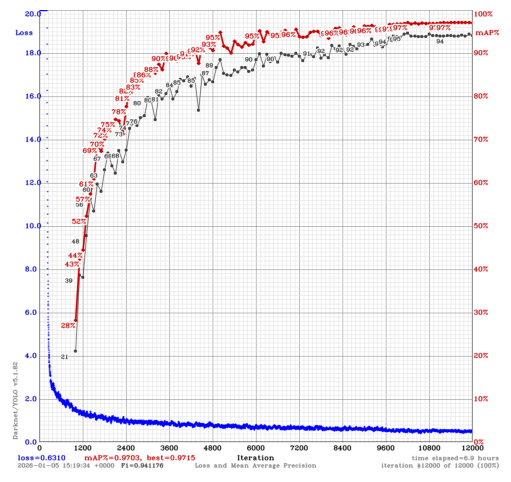

In [22]:
from PIL import Image
import matplotlib.pyplot as plt

img = Image.open("chart.png")

plt.figure(figsize=(10, 6))
plt.imshow(img)
plt.axis("off")

In [25]:
from pathlib import Path
import random

n_samples = 4
test_dir = Path("seaship-3/test")
outdir = Path("test_results")
cfg = "yolov4-tiny-seaship.cfg"
names = "seaship.names"
weights = "backup/yolov4-tiny-seaship_best.weights"

outdir.mkdir(exist_ok=True)

images = list(test_dir.glob("*.jpg"))
samples = random.sample(images, n_samples)

for img in samples:
    !DarkHelp \
        --json \
        --autohide off \
        --keep \
        --duration off \
        --fontscale 0.7 \
        --line 5 \
        --shade 0.25 \
        --threshold 0.5 \
        --outdir {outdir} \
        {cfg} {names} {weights} {img}

-> config file:  yolov4-tiny-seaship.cfg
-> weights file: backup/yolov4-tiny-seaship_best.weights
-> names file:   seaship.names
-> driver:       Darknetd
0: compute_capability=860, cudnn_half=1, GPU=NVIDIA GeForce RTX 3080 Ti
Allocating workspace to transfer between CPU and GPU:  9.7 MiB
-> loading network took 1644.241 milliseconds
-> neural network dimensions: 416x416
-> output directory: test_results
-> looking for image and video files
-> found 1 file
setting message: "press 'h' for help"
#1/1: loading "seaship-3/test/003203_jpg.rf.fee1c984851c7ef30d78c3ee62f53eb7.jpg"
-> prediction took 138.633 milliseconds
-> prediction results: 1
-> 1/1: "ore carrier 80%" #4 prob=0.801181 x=222 y=291 w=1540 h=223 oid=0 tile=0 entries=1
-> annotated image saved to "test_results/003203_jpg.rf.fee1c984851c7ef30d78c3ee62f53eb7.png"
JSON OUTPUT
{
    "argv": "DarkHelp --json --autohide off --keep --duration off --fontscale 0.7 --line 5 --shade 0.25 --threshold 0.5 --outdir test_results yolov4-tiny-s

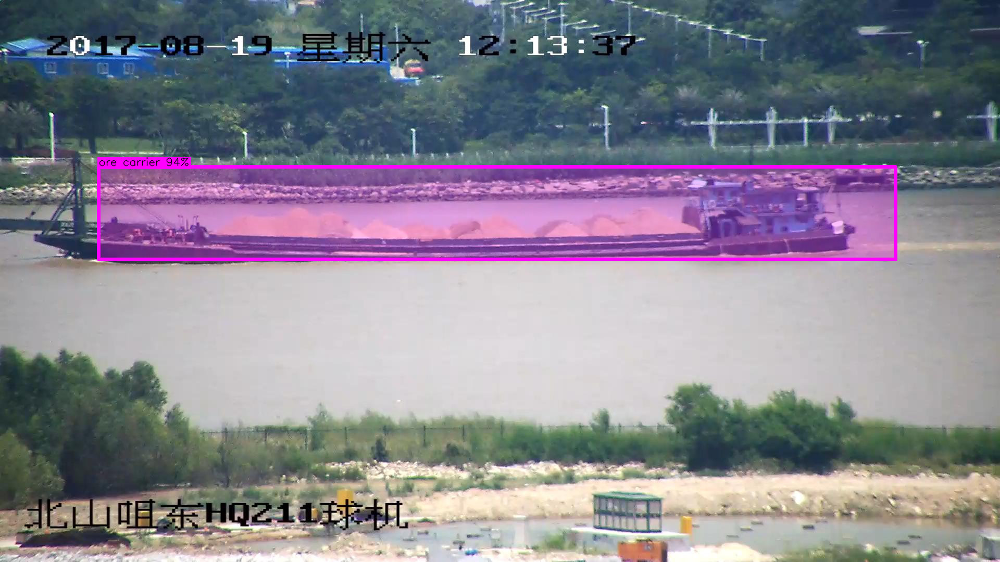

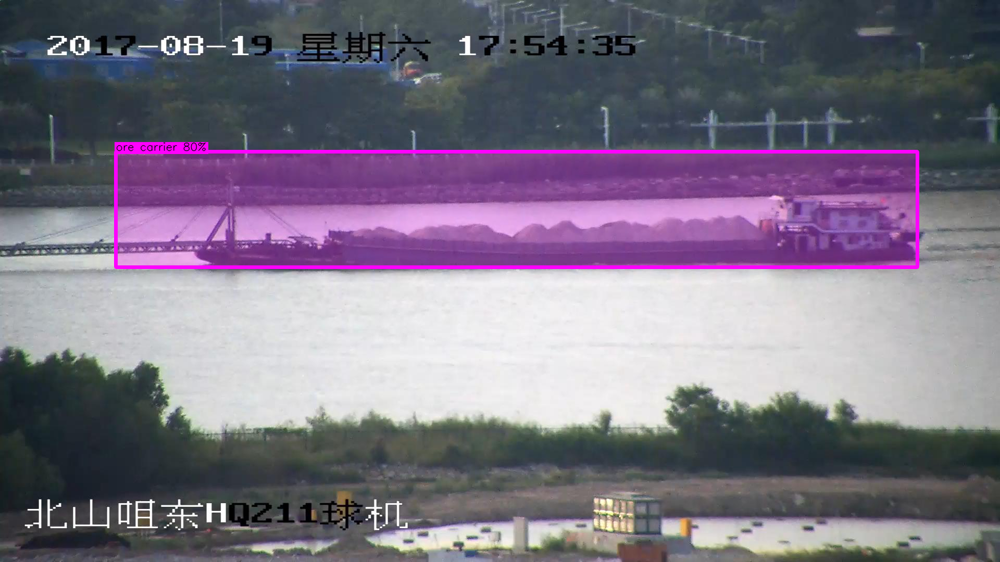

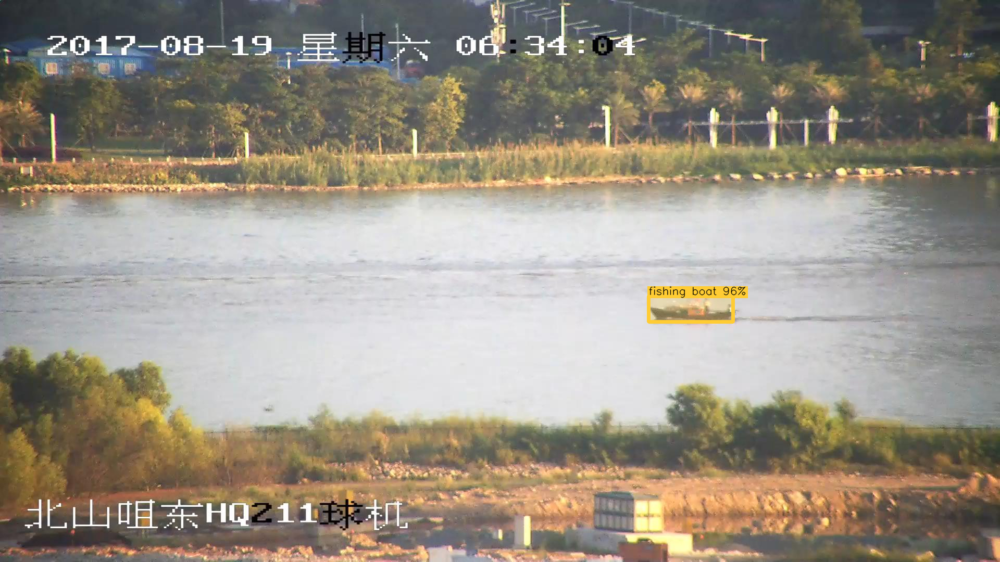

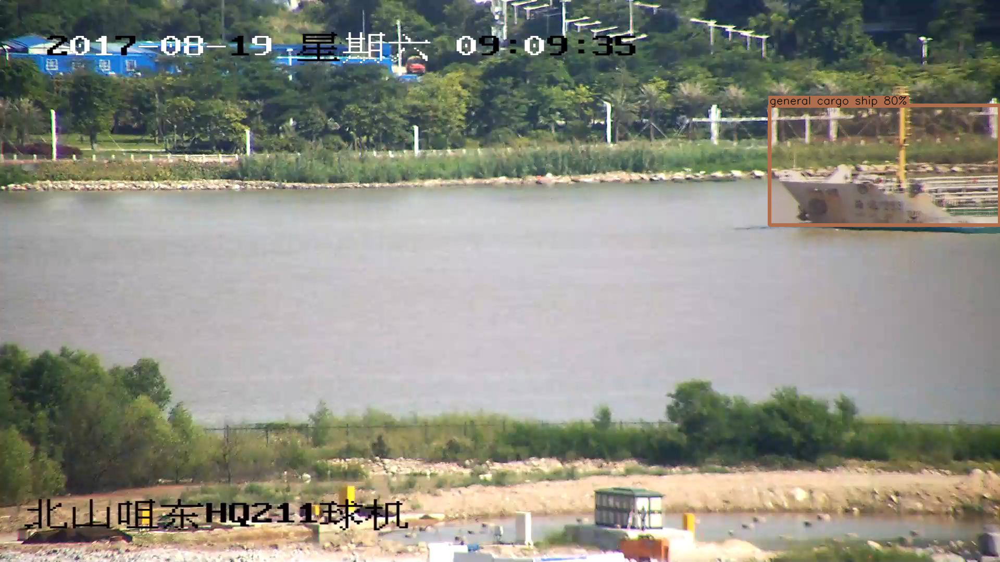

In [27]:
from IPython.display import Image, display

for img in sorted(outdir.glob("*.png"))[-n_samples:]:
    display(Image(filename=str(img), width=600))